<div align=center>

<p></p>
<p></p>
<font size=5>
In the Name of God
<font/>
<p></p>
 <br/>
    <br/>
<font color=#4d7db8>
Sharif University of Technology - Department of Electrical Engineering
</font>
<p></p>
<font color=#4d7db8>
Introduction To Machine Learning - Dr. Sajjad Amini
</font>
<br/>
<br/>
Spring Semester 1401-02

<div/>

<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
Project - 3rd Phase
<br />
Image Super Resolution using Autoencoder
			</font>
    <br/>
<font size=4>
			<br/><br/>
Due on Tir 10th
                <br/><b>
              Cheating is Strongly Prohibited
                </b><br/><br/>
                <font color=green>
Should you have any questions concerning the project, please feel free to ask via Telegram.
     </font>
</font>
                <br/>
    </div>

# Personal Info
<hr/>
    <div class="column" align=center>
    <font size=4>
        <div class="column">
        <br />
            student_number = 99106114
            <br />
            Name = Mobin   
            <br />
            Last_Name = Khatib
        </div>
        <div class="column">
        <br />
            student_number = 99109768
            <br />
            Name = Mohammad Ali   
            <br />
            Last_Name = Hashemifar
        </div>
    </font>
    </div>


1. Download the "image super resolution (from unsplash)" dataset and split it's validation set to new validation set and test set.
2. Design and train an AutoEncoder using `PyTorch` (not `TensorFlow`) on the dataset to enhance the resolution of images from low resolution to high resolution.
3. plot learning curve and visualize low resolution images of test set, their corresponding high resolution images and their reconstructed versions side by side.

# Import Necessary Libraries

In [ ]:
import torch
from torchvision.datasets import FashionMNIST
from torchvision import transforms
from torch.utils.data import DataLoader, random_split

import numpy as np
from matplotlib import pyplot as plt
from typing import Dict

import torch.nn as nn
import torch.nn.functional as F
import glob
import cv2
from google.colab.patches import cv2_imshow

# Load Dataset and Prepare It

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download quadeer15sh/image-super-resolution-from-unsplash
! unzip /content/image-super-resolution-from-unsplash.zip

mkdir: cannot create directory ‘/root/.kaggle’: File exists
image-super-resolution-from-unsplash.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  /content/image-super-resolution-from-unsplash.zip
replace Image Super Resolution - Unsplash/high res/1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
high_res = []
low_res = []

for i in range(200):
  for file in glob.glob("Image Super Resolution - Unsplash/high res/*.jpg"):
    high_res.append(cv2.imread(file))
    i = i+1
    if i == 200 :
      break
  break

for i in range(200):
  for file in glob.glob("Image Super Resolution - Unsplash/low res/*.jpg"):
    low_res.append(cv2.imread(file))
    i = i+1
    if i == 200 :
      break
  break

for i, img in enumerate(high_res, 0):
    high_res[i] = cv2.resize(img, (1200, 800)).transpose((2, 0, 1))
for i, img in enumerate(low_res, 0):
    low_res[i] = cv2.resize(img, (1200, 800)).transpose((2, 0, 1))

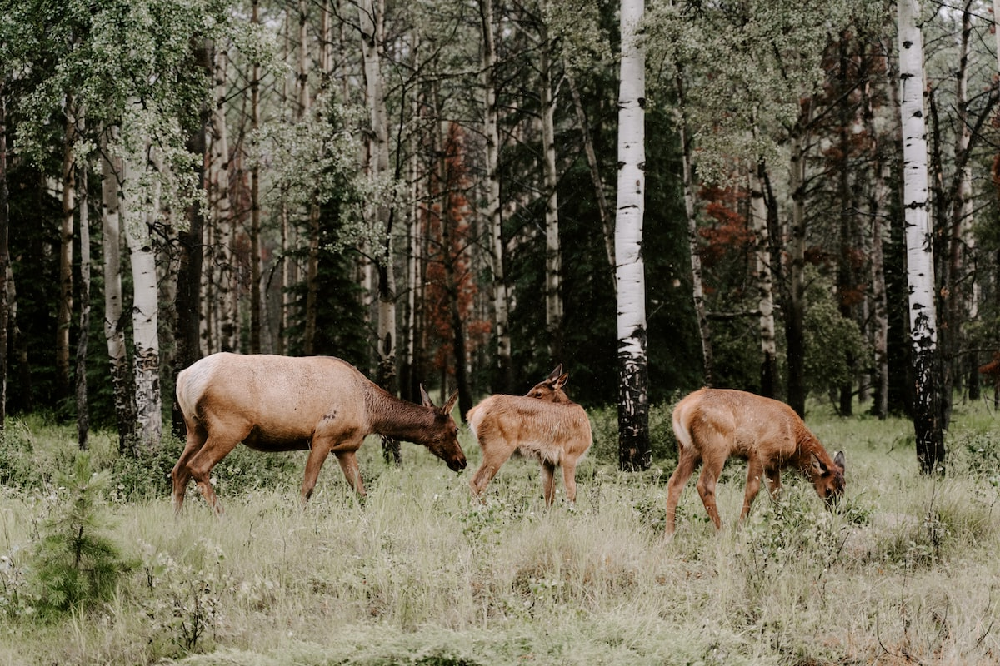

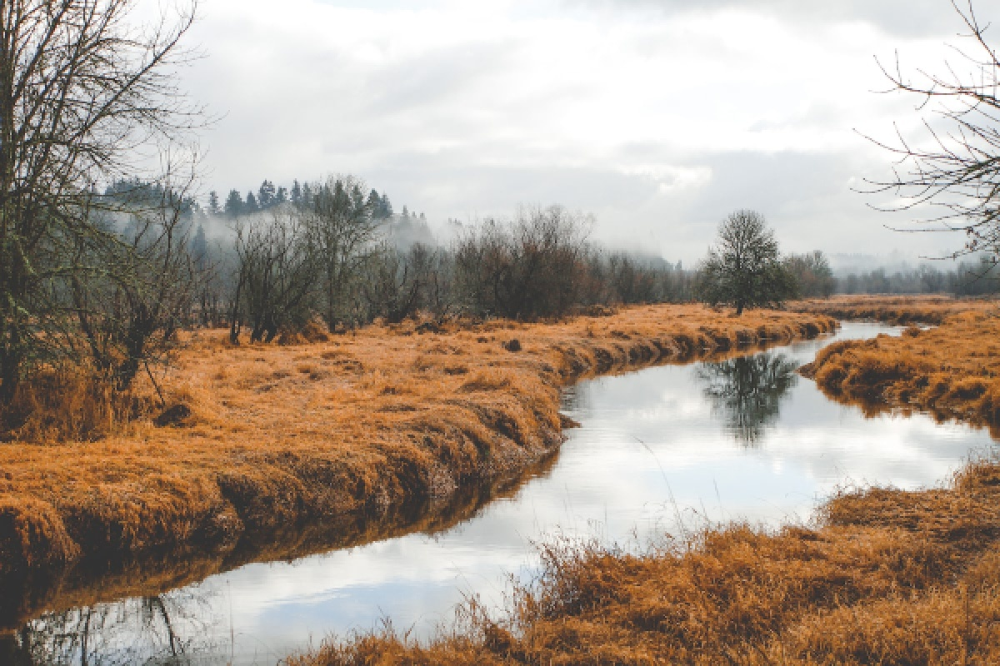

In [ ]:
# cv2_imshow(high_res[1].transpose((1,2,0)))
# cv2_imshow(low_res[1].transpose((1,2,0)))

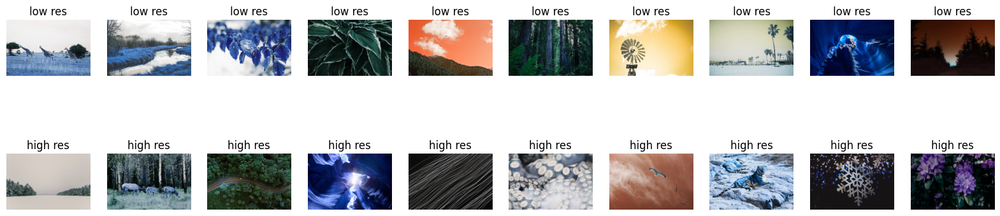

In [ ]:
fig, axs = plt.subplots(2,10,figsize=(20,5))
for i in range(10):
    axs[0,i].imshow(low_res[i].transpose((1,2,0)))
    axs[0,i].set_title('low res')
    axs[0,i].axis('off')
    axs[1,i].imshow(high_res[i].transpose((1,2,0)))
    axs[1,i].set_title('high res')
    axs[1,i].axis('off')

In [ ]:
train_set, test_set, validation_set = random_split(list(zip(high_res, low_res)), [0.7, 0.2, 0.1])
train_loader = DataLoader(train_set, 4, shuffle=False)
test_loader = DataLoader(test_set, 4, shuffle=False)
validation_loader = DataLoader(validation_set, 4, shuffle=False)

# Define Your Model
torch neural network model

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = torch.nn.Sequential(
            nn.Conv2d(3,64,3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64,128,3, padding='same'),
            nn.ReLU(),
        )
        self.decoder = torch.nn.Sequential(
            nn.Conv2d(128,64,3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64,3,3, padding='same'),
            nn.ReLU(),
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

model = Net()
# setting the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Fit The Model
Also Define optimizer, Criterion and other parameters

In [ ]:
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), 0.001)

epoch_nums = 20  ## Number of epochs
total_train_loss = []
total_validation_loss = []

for epoch in range(epoch_nums):  # loop over the dataset multiple times

    train_loss = 0
    validation_loss = 0

    for i, (low_res, high_res) in enumerate(train_loader, 0):
        low_res, high_res = low_res.to(device), high_res.to(torch.float32).to(device)

        outputs = model(low_res.to(torch.float32).to(device))

        loss = loss_function(outputs,high_res)

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        train_loss = train_loss + loss.item()
    train_loss = train_loss/len(train_loader.dataset)/100
    total_train_loss.append(train_loss)

    model.eval()

    with torch.no_grad():
        for i, (low_res, high_res) in enumerate(validation_loader, 0):
            low_res, high_res = low_res.to(device), high_res.to(torch.float32).to(device)

            outputs = model(low_res.to(torch.float32))

            loss = loss_function(outputs,high_res)

            validation_loss = validation_loss + loss.item()
        validation_loss =  validation_loss/len(validation_loader.dataset)/100
        total_validation_loss.append(train_loss)


    print(f'epoch number: [{epoch+1}] Train loss: {train_loss :.3f}  Validation Loss: {validation_loss }')

print('Finished Training')

epoch number: [1] Train loss: 27.293  Validation Loss: 21.767479492187498
epoch number: [2] Train loss: 23.256  Validation Loss: 20.787197509765623
epoch number: [3] Train loss: 23.531  Validation Loss: 21.114109374999998
epoch number: [4] Train loss: 22.680  Validation Loss: 21.445937744140625
epoch number: [5] Train loss: 22.638  Validation Loss: 21.476103759765625
epoch number: [6] Train loss: 22.502  Validation Loss: 21.027973876953123
epoch number: [7] Train loss: 22.204  Validation Loss: 21.254357177734374
epoch number: [8] Train loss: 22.383  Validation Loss: 20.814618896484376
epoch number: [9] Train loss: 22.290  Validation Loss: 20.996915283203126
epoch number: [10] Train loss: 22.094  Validation Loss: 20.943496582031248
epoch number: [11] Train loss: 21.872  Validation Loss: 21.241218017578127
epoch number: [12] Train loss: 21.913  Validation Loss: 20.616528076171875
epoch number: [13] Train loss: 22.120  Validation Loss: 20.649380615234378
epoch number: [14] Train loss: 21.

# Plot The Results

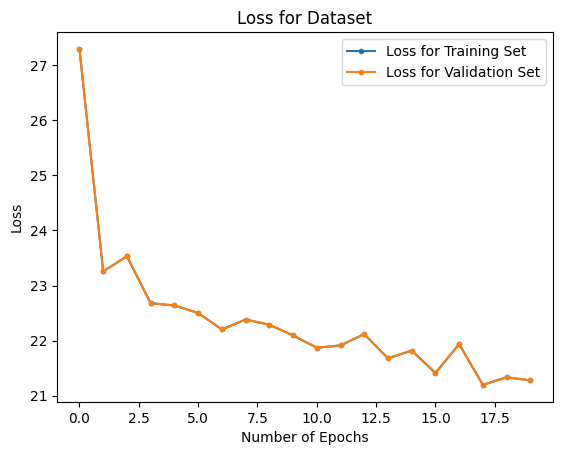

In [ ]:
plt.plot(total_train_loss,marker = '.')
plt.plot(total_validation_loss,marker = '.')
plt.title('Loss for Dataset');
plt.xlabel('Number of Epochs');
plt.ylabel('Loss');
plt.legend(['Loss for Training Set','Loss for Validation Set']);

In [ ]:
fig, axs = plt.subplots(3, 2, figsize=(12*20, 8*20))

for i, (low, high) in enumerate(test_loader, 0):
  low, high = low.to(device), high.to(device)
  outputs = model(low.to(torch.float32).to(device))

  low = low.cpu().numpy()
  high = high.cpu().numpy()
  outputs = outputs.cpu().detach().numpy()
  for j in range(3):
    axs[j,0].imshow(low[j].transpose(1,2,0)/255)
    axs[j,0].set_title('low res')
    axs[j,0].axis('off')
    axs[j,1].imshow(outputs[j].transpose(1,2,0)/255)
    axs[j,1].set_title('Output')
    axs[j,1].axis('off')
  plt.show()
  break